In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import collections

import numpy as np
import pandas as pd


from IPython.display import Image
import tensorflow as tf
print('This code requires TensorFlow v1.3+')
print('You have:', tf.__version__)

This code requires TensorFlow v1.3+
You have: 1.3.0


In [2]:
census_train_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data'
census_test_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test'
census_train_path = tf.contrib.keras.utils.get_file('census.train', census_train_url)
census_test_path = tf.contrib.keras.utils.get_file('census.test', census_test_url)

1990656/2003153 [============================>.] - ETA: 0s

In [3]:
census_test_url

'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test'

In [4]:
census_train_path

'C:\\Users\\G560667\\.keras\\datasets\\census.train'

In [5]:
column_names = [
  'age', 'workclass', 'fnlwgt', 'education', 'education-num',
  'marital-status', 'occupation', 'relationship', 'race', 'gender',
  'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
  'income'
]

In [6]:
census_train = pd.read_csv(census_train_path, index_col=False, names=column_names) 
census_test = pd.read_csv(census_test_path, skiprows=1, index_col=False, names=column_names) 

In [7]:
census_train.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [8]:
census_test.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K.
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K.
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K.
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K.
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K.


In [9]:
census_train.describe

<bound method NDFrame.describe of        age          workclass  fnlwgt      education  education-num  \
0       39          State-gov   77516      Bachelors             13   
1       50   Self-emp-not-inc   83311      Bachelors             13   
2       38            Private  215646        HS-grad              9   
3       53            Private  234721           11th              7   
4       28            Private  338409      Bachelors             13   
5       37            Private  284582        Masters             14   
6       49            Private  160187            9th              5   
7       52   Self-emp-not-inc  209642        HS-grad              9   
8       31            Private   45781        Masters             14   
9       42            Private  159449      Bachelors             13   
10      37            Private  280464   Some-college             10   
11      30          State-gov  141297      Bachelors             13   
12      23            Private  122272      

In [10]:
census_train.shape

(32561, 15)

In [11]:
census_train=census_train.dropna(how='any',axis=0)

In [12]:
census_test = census_test.dropna(how="any", axis=0)

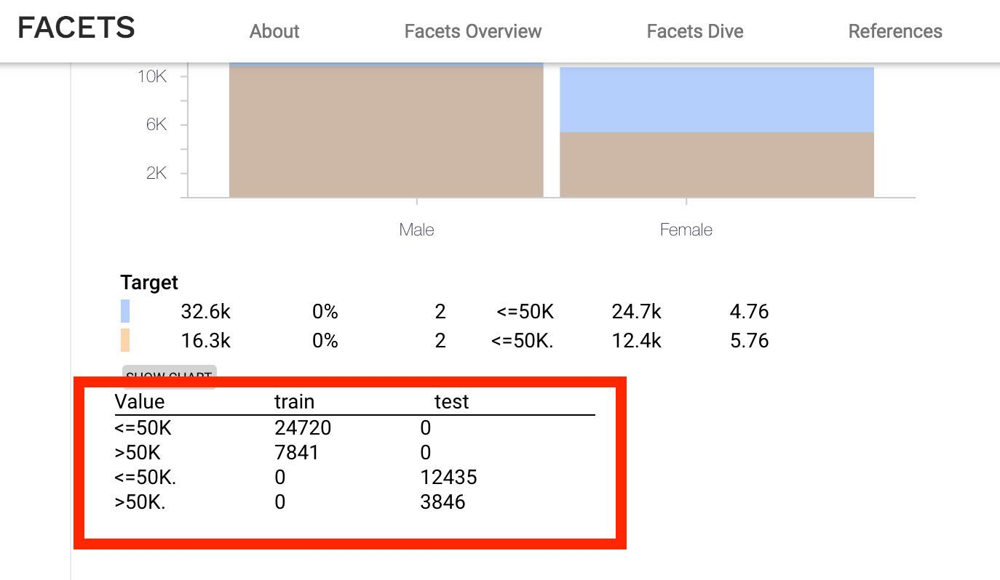

In [13]:
Image(filename='./images/facets2.jpg', width=500)

In [16]:
import sys
# FACETS_PATH is the full path to the python file in the clonde github repo of Facets.
# It should look similar to this: ".../facets/facets_overview/python"
# If you have cloned the facets repo to your current working directory, you can proceed.
# If you have chosen another location, just add it here.

FACETS_PATH = 'C:\\Users\\G560667\\Desktop\\Enterprise Deep Learning with TF\\facets-master\\facets-master\\facets_overview\\python'
sys.path.append(FACETS_PATH)

In [20]:
FACETS_PATH
import os
print (os.getcwd())

\\inmbfp1\redirect1\G560667\My Documents\Enterprise Deep Learning with TF\openSAP_ml2_Week_02_Exercises


In [21]:
## Facets Overview
from generic_feature_statistics_generator import GenericFeatureStatisticsGenerator
import base64

gfsg = GenericFeatureStatisticsGenerator()
proto = gfsg.ProtoFromDataFrames([{'name': 'train', 'table': census_train},
                                  {'name': 'test', 'table': census_test}])
protostr = base64.b64encode(proto.SerializeToString()).decode("utf-8")

# Display the facets overview visualization for this data
from IPython.core.display import display, HTML

HTML_TEMPLATE = """<link rel="import" href="/nbextensions/facets-dist/facets-jupyter.html" >
        <facets-overview id="elem"></facets-overview>
        <script>
          document.querySelector("#elem").protoInput = "{protostr}";
        </script>"""

html = HTML_TEMPLATE.format(protostr=protostr)
display(HTML(html))

In [24]:
## Facets Dive
jsonstr = census_train.to_json(orient='records')
HTML_TEMPLATE = \
    """
        <link rel="import" href="/nbextensions/facets-dist/facets-jupyter.html">
        <facets-dive id="elem_id" height="600"></facets-dive>
        <script>
          var data = {jsonstr};
          document.querySelector("#elem_id").data = data;
        </script>
    """
html = HTML_TEMPLATE.format(jsonstr=jsonstr)
display(HTML(html))

In [25]:
census_train_label = census_train.pop('income').apply(lambda x: ">50K" in x)
census_test_label = census_test.pop('income').apply(lambda x: ">50K" in x)

In [26]:
census_train_label

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7         True
8         True
9         True
10        True
11        True
12       False
13       False
14        True
15       False
16       False
17       False
18       False
19        True
20        True
21       False
22       False
23       False
24       False
25        True
26       False
27        True
28       False
29       False
         ...  
32531    False
32532     True
32533     True
32534    False
32535    False
32536     True
32537    False
32538     True
32539     True
32540    False
32541    False
32542    False
32543    False
32544    False
32545     True
32546    False
32547    False
32548    False
32549    False
32550    False
32551    False
32552    False
32553    False
32554     True
32555    False
32556    False
32557     True
32558    False
32559    False
32560     True
Name: income, dtype: bool

In [27]:
print('Training examples count : %d' % census_train.shape[0])

Training examples count : 32561


In [34]:
print('Test examples count : %d' % census_test.shape[0] ) 

Test examples count : 16281


In [35]:
census_train_label.shape

(32561,)

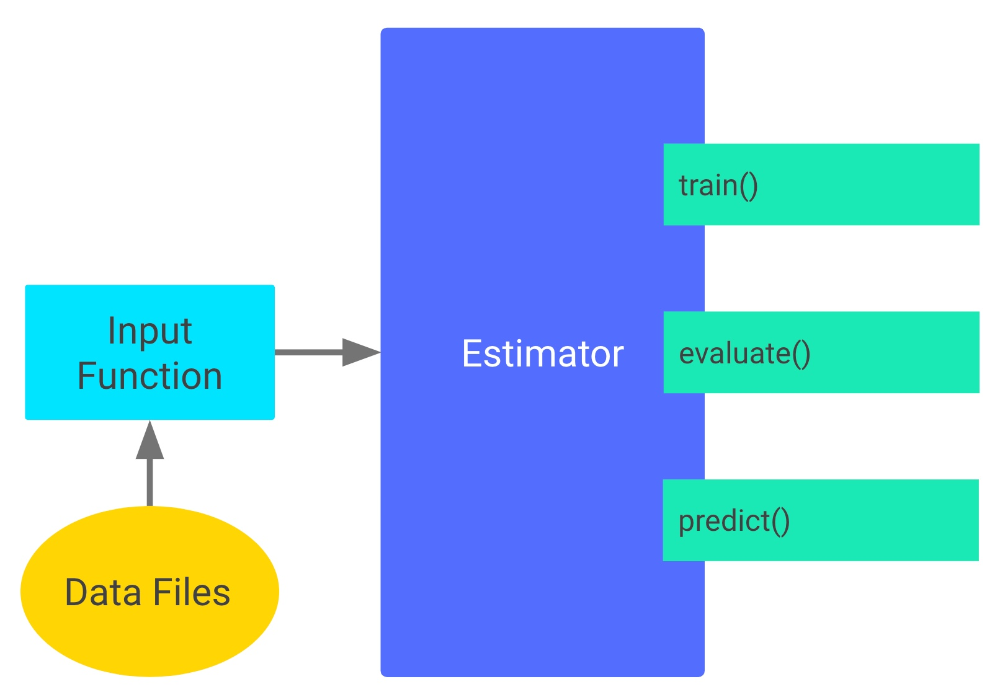

In [36]:
Image(filename='./images/estimators1.jpeg', width=400)

In [37]:
##Canned Estimators
##Linear Classifier

def train_input():
    return tf.estimator.inputs.pandas_input_fn(
    x=census_train,
    y=census_train_label,    
    batch_size=32,
    num_epochs=None,
    shuffle=True    
    )


def test_input():
    return tf.estimator.inputs.pandas_input_fn(
    x=census_test,
    y=census_test_label,    
    num_epochs=1,
    shuffle=False    
    )

In [38]:
features_names=[]

In [39]:
age=tf.feature_column.numeric_column('age')
features_names.append(age)

In [41]:
age_buckets = tf.feature_column.bucketized_column(
    tf.feature_column.numeric_column('age'),
    boundaries=[31, 46, 60, 75, 90]
)
features_names.append(age_buckets)

In [45]:
education = tf.feature_column.categorical_column_with_vocabulary_list(
    "education", [
        "Bachelors", "HS-grad", "11th", "Masters", "9th",
        "Some-college", "Assoc-acdm", "Assoc-voc", "7th-8th",
        "Doctorate", "Prof-school", "5th-6th", "10th", "1st-4th",
        "Preschool", "12th"
    ])
features_names.append(education)

In [47]:
##categorical with lot of values 
native_country = tf.feature_column.categorical_column_with_hash_bucket('native-country', 1000)
features_names.append(native_country)

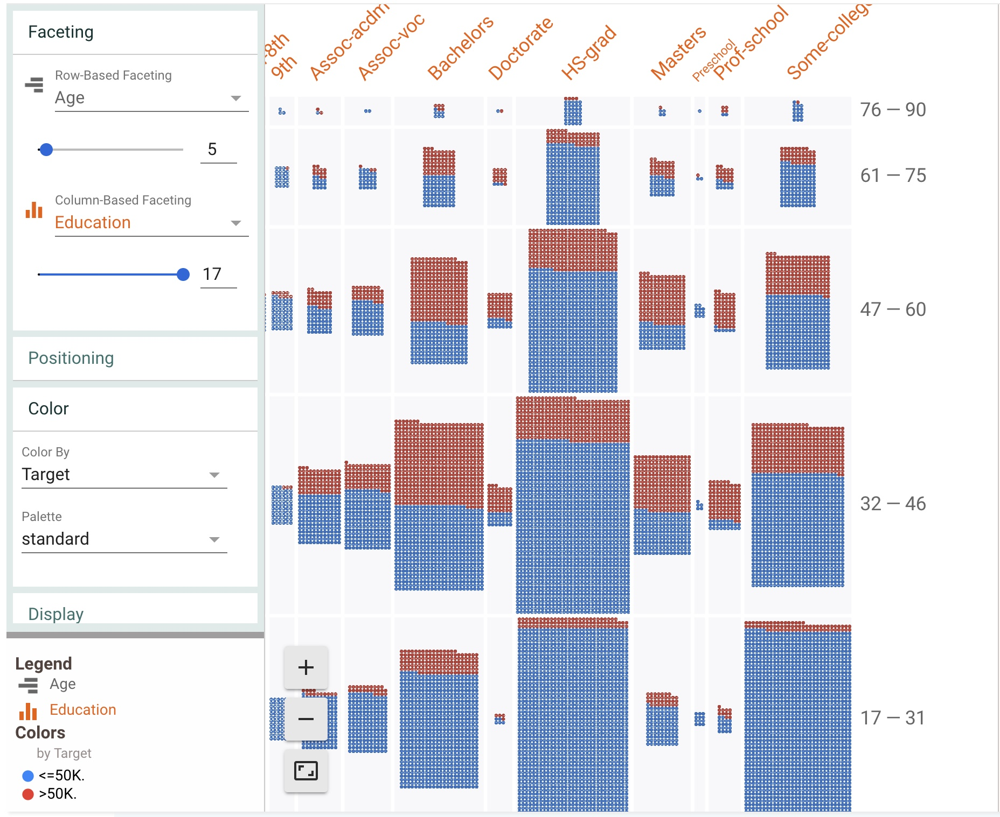

In [48]:
Image(filename='./images/crossed.jpeg', width=400)

In [49]:
## why do we need crossed column ?
age_cross_education = tf.feature_column.crossed_column(
    [age_buckets, education],
    hash_bucket_size=int(1e4) # Using a hash is handy here
)
features_names.append(age_cross_education)

In [50]:
features_names

[_NumericColumn(key='age', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 _BucketizedColumn(source_column=_NumericColumn(key='age', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), boundaries=(31, 46, 60, 75, 90)),
 _VocabularyListCategoricalColumn(key='education', vocabulary_list=('Bachelors', 'HS-grad', '11th', 'Masters', '9th', 'Some-college', 'Assoc-acdm', 'Assoc-voc', '7th-8th', 'Doctorate', 'Prof-school', '5th-6th', '10th', '1st-4th', 'Preschool', '12th'), dtype=tf.string, default_value=-1, num_oov_buckets=0),
 _HashedCategoricalColumn(key='native-country', hash_bucket_size=1000, dtype=tf.string),
 _CrossedColumn(keys=(_BucketizedColumn(source_column=_NumericColumn(key='age', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None), boundaries=(31, 46, 60, 75, 90)), _VocabularyListCategoricalColumn(key='education', vocabulary_list=('Bachelors', 'HS-grad', '11th', 'Masters', '9th', 'Some-college', 'Assoc-acdm', 'Assoc-voc

In [51]:
input_train = train_input()
estimator=tf.estimator.LinearClassifier(features_names,model_dir='graphs/Linear',n_classes=2)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_save_summary_steps': 100, '_keep_checkpoint_max': 5, '_save_checkpoints_secs': 600, '_keep_checkpoint_every_n_hours': 10000, '_save_checkpoints_steps': None, '_tf_random_seed': 1, '_model_dir': 'graphs/Linear', '_log_step_count_steps': 100, '_session_config': None}


In [52]:
estimator.train(input_train, steps=1000)

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Saving checkpoints for 1 into graphs/Linear\model.ckpt.
INFO:tensorflow:loss = 22.1807, step = 1
INFO:tensorflow:global_step/sec: 198.275
INFO:tensorflow:loss = 19.4018, step = 101 (0.520 sec)
INFO:tensorflow:global_step/sec: 240.901
INFO:tensorflow:loss = 12.7315, step = 201 (0.421 sec)
INFO:tensorflow:global_step/sec: 240.469
INFO:tensorflow:loss = 15.5296, step = 301 (0.409 sec)
INFO:tensorflow:global_step/sec: 277.035
INFO:tensorflow:loss = 14.268, step = 401 (0.361 sec)
INFO:tensorflow:global_step/sec: 259.045
INFO:tensorflow:loss = 15.9039, step = 501 (0.399 sec)
INFO:tensorflow:global_step/sec: 221.137
INFO:tensorflow:loss = 9.57756, step = 601 (0.441 sec)
INFO:tensorflow:global_step/sec: 242.659
INFO:tensorflow:loss = 18.1491, step = 701 (0.421 sec)
INFO:tensorflow:global_step/sec: 230.328
INFO:tensorflow:loss = 16.0386, step = 801 (0.418 sec)
INFO:tensorflow:global_step/sec: 263.148
INFO:tensorflow:loss = 13.9127, ste

In [53]:
test_input=test_input()
estimator.evaluate(test_input)

INFO:tensorflow:Starting evaluation at 2017-11-02-14:18:39
INFO:tensorflow:Restoring parameters from graphs/Linear\model.ckpt-1000
INFO:tensorflow:Finished evaluation at 2017-11-02-14:18:41
INFO:tensorflow:Saving dict for global step 1000: accuracy = 0.763958, accuracy_baseline = 0.763774, auc = 0.692855, auc_precision_recall = 0.366471, average_loss = 0.492486, global_step = 1000, label/mean = 0.236226, loss = 62.6419, prediction/mean = 0.213764


{'accuracy': 0.76395798,
 'accuracy_baseline': 0.76377374,
 'auc': 0.69285488,
 'auc_precision_recall': 0.36647087,
 'average_loss': 0.49248603,
 'global_step': 1000,
 'label/mean': 0.23622628,
 'loss': 62.641914,
 'prediction/mean': 0.21376371}

In [54]:
estimator

In [57]:
predictions = estimator.predict(test_input)
predictions

<generator object Estimator.predict at 0x000001F001C35048>

In [56]:
i = 0
for prediction in predictions:
    true_label = census_test_label[i]
    predicted_label = prediction['class_ids'][0]
    # Uncomment the following line to see probabilities for individual classes
    # print(prediction) 
    print("Example %d. Actual: %d, Predicted: %d" % (i, true_label, predicted_label))
    i += 1
    if i == 5: break

INFO:tensorflow:Restoring parameters from graphs/Linear\model.ckpt-1000
Example 0. Actual: 0, Predicted: 0
Example 1. Actual: 0, Predicted: 0
Example 2. Actual: 1, Predicted: 0
Example 3. Actual: 1, Predicted: 0
Example 4. Actual: 0, Predicted: 0


## DNN Classifier

In [58]:
workclass = tf.feature_column.categorical_column_with_vocabulary_list(
    'workclass',
    [' Self-emp-not-inc', ' Private', ' State-gov', ' Federal-gov',
     ' Local-gov', ' ?', ' Self-emp-inc', ' Without-pay', ' Never-worked'])

education = tf.feature_column.categorical_column_with_vocabulary_list(
    'education',
    [' Bachelors', ' HS-grad', ' 11th', ' Masters', ' 9th', ' Some-college',
     ' Assoc-acdm', ' Assoc-voc', ' 7th-8th', ' Doctorate', ' Prof-school',
     ' 5th-6th', ' 10th', ' 1st-4th', ' Preschool', ' 12th'])

marital_status = tf.feature_column.categorical_column_with_vocabulary_list(
    'marital-status',
    [' Married-civ-spouse', ' Divorced', ' Married-spouse-absent',
     ' Never-married', ' Separated', ' Married-AF-spouse', ' Widowed'])
     
relationship = tf.feature_column.categorical_column_with_vocabulary_list(
    'relationship',
    [' Husband', ' Not-in-family', ' Wife', ' Own-child', ' Unmarried',
     ' Other-relative'])

In [59]:
feature_columns = [

    # Use indicator columns for low dimensional vocabularies
    tf.feature_column.indicator_column(workclass),
    tf.feature_column.indicator_column(education),
    tf.feature_column.indicator_column(marital_status),
    tf.feature_column.indicator_column(relationship),

    # Use embedding columns for high dimensional vocabularies
    tf.feature_column.embedding_column(  # now using embedding!
        # params are hash buckets, embedding size
        tf.feature_column.categorical_column_with_hash_bucket('occupation', 100), 10),
    
    # numeric features
    tf.feature_column.numeric_column('age'),
    tf.feature_column.numeric_column('education-num'),
    tf.feature_column.numeric_column('capital-gain'),
    tf.feature_column.numeric_column('capital-loss'),
    tf.feature_column.numeric_column('hours-per-week'),   
]

In [61]:
estimator=tf.estimator.DNNClassifier(hidden_units = [256,128,64,32],
                                     feature_columns=feature_columns,
                                     n_classes=2, 
                                     model_dir='graphs/dnn'
                                    )

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_save_summary_steps': 100, '_keep_checkpoint_max': 5, '_save_checkpoints_secs': 600, '_keep_checkpoint_every_n_hours': 10000, '_save_checkpoints_steps': None, '_tf_random_seed': 1, '_model_dir': 'graphs/dnn', '_log_step_count_steps': 100, '_session_config': None}


In [63]:

estimator.train(input_train, steps=2000)

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Saving checkpoints for 1 into graphs/dnn\model.ckpt.
INFO:tensorflow:loss = 198.404, step = 1
INFO:tensorflow:global_step/sec: 158.045
INFO:tensorflow:loss = 19.4544, step = 101 (0.647 sec)
INFO:tensorflow:global_step/sec: 194.034
INFO:tensorflow:loss = 16.5232, step = 201 (0.514 sec)
INFO:tensorflow:global_step/sec: 194.036
INFO:tensorflow:loss = 15.8756, step = 301 (0.509 sec)
INFO:tensorflow:global_step/sec: 183.672
INFO:tensorflow:loss = 7.89663, step = 401 (0.547 sec)
INFO:tensorflow:global_step/sec: 189.97
INFO:tensorflow:loss = 12.6777, step = 501 (0.520 sec)
INFO:tensorflow:global_step/sec: 195.174
INFO:tensorflow:loss = 13.2486, step = 601 (0.515 sec)
INFO:tensorflow:global_step/sec: 221.631
INFO:tensorflow:loss = 9.88971, step = 701 (0.451 sec)
INFO:tensorflow:global_step/sec: 204.792
INFO:tensorflow:loss = 11.7982, step = 801 (0.489 sec)
INFO:tensorflow:global_step/sec: 192.537
INFO:tensorflow:loss = 10.0955, step =

In [64]:
estimator.evaluate(test_input)

INFO:tensorflow:Starting evaluation at 2017-11-02-15:00:39
INFO:tensorflow:Restoring parameters from graphs/dnn\model.ckpt-2000
INFO:tensorflow:Finished evaluation at 2017-11-02-15:00:41
INFO:tensorflow:Saving dict for global step 2000: accuracy = 0.800995, accuracy_baseline = 0.763774, auc = 0.867257, auc_precision_recall = 0.62317, average_loss = 0.371071, global_step = 2000, label/mean = 0.236226, loss = 47.1986, prediction/mean = 0.219151


{'accuracy': 0.80099505,
 'accuracy_baseline': 0.76377374,
 'auc': 0.86725748,
 'auc_precision_recall': 0.62316984,
 'average_loss': 0.37107149,
 'global_step': 2000,
 'label/mean': 0.23622628,
 'loss': 47.198555,
 'prediction/mean': 0.21915115}

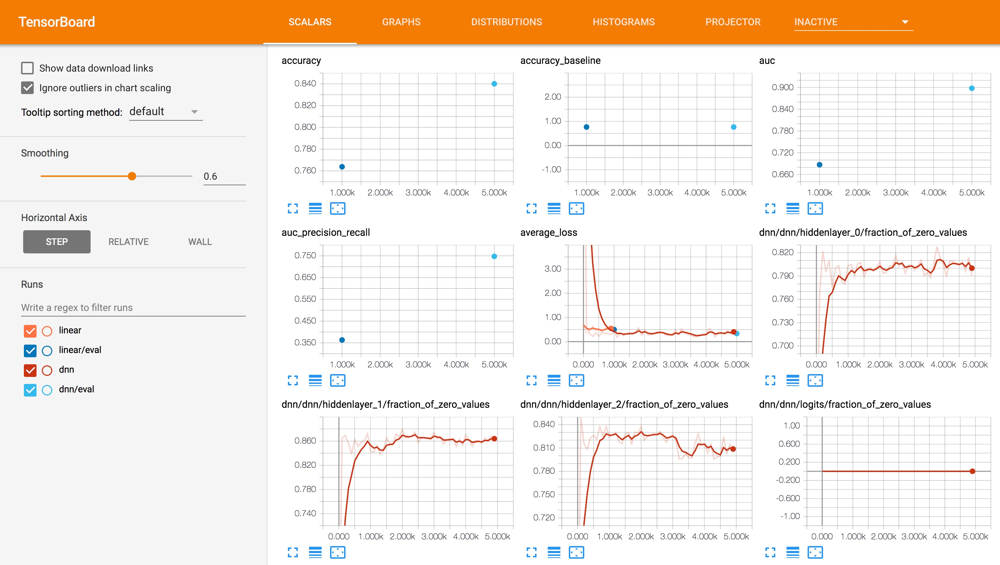

In [65]:
Image(filename='./images/tensorboard.jpeg', width=500)

# TensorBoard

### Start  Terminal with this command
tensorboard --logdir C:\Users\G560667\Desktop\Enterprise_Deep_Learning_with_TF\graphs --debug